# Importing Library & Reading Dataset

In [1]:
# Import libraries

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from sklearn import linear_model
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error

# Supress Warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
# To display all columns from dataframe

pd.set_option('display.max_columns', None)

In [3]:
# Reading dataset

df =pd.read_csv('train.csv')

In [4]:
# Checking top 5 rows of the data

df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [5]:
# Checking data info
'''Total we have 80 columns including target column'''

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [6]:
# check distribution of data 
df.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


# Data Understanding & Data Cleaning

In [7]:
# Lets print columns having any null values and count of the null values
'''In total there are 19 columns having null values. We need to inspect these columns and check data defination 
to impute these null values'''

df.loc[:,df.isnull().any()].isnull().sum()

LotFrontage      259
Alley           1369
MasVnrType         8
MasVnrArea         8
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinType2      38
Electrical         1
FireplaceQu      690
GarageType        81
GarageYrBlt       81
GarageFinish      81
GarageQual        81
GarageCond        81
PoolQC          1453
Fence           1179
MiscFeature     1406
dtype: int64

In [8]:
## Lets calculate the percentage of missing values
'''We can see that columns like Alley,PoolQC and MiscFeature has more than 90% missing values. Lets inspect 
these all column in details to undesrtnd the missing value.
'''
round(100*(df.loc[:, df.isnull().any()].isnull().sum())/len(df), 2)

LotFrontage     17.74
Alley           93.77
MasVnrType       0.55
MasVnrArea       0.55
BsmtQual         2.53
BsmtCond         2.53
BsmtExposure     2.60
BsmtFinType1     2.53
BsmtFinType2     2.60
Electrical       0.07
FireplaceQu     47.26
GarageType       5.55
GarageYrBlt      5.55
GarageFinish     5.55
GarageQual       5.55
GarageCond       5.55
PoolQC          99.52
Fence           80.75
MiscFeature     96.30
dtype: float64

In [9]:
# There are some columns need to chnage to cateygory from int/object type as per data definition also check their value counts

df['MSSubClass']=df['MSSubClass'].astype('object')

In [10]:
category_clm = list(df.select_dtypes('object').columns)

print(category_clm)

['MSSubClass', 'MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition']


In [11]:
# Lets see the distribution for categorical column


def get_counts(name):
    print(f'\n**{name}** :\n')
    print(df[name].astype('category').value_counts())


for clm in category_clm:
    get_counts(clm)


**MSSubClass** :

20     536
60     299
50     144
120     87
30      69
160     63
70      60
80      58
90      52
190     30
85      20
75      16
45      12
180     10
40       4
Name: MSSubClass, dtype: int64

**MSZoning** :

RL         1151
RM          218
FV           65
RH           16
C (all)      10
Name: MSZoning, dtype: int64

**Street** :

Pave    1454
Grvl       6
Name: Street, dtype: int64

**Alley** :

Grvl    50
Pave    41
Name: Alley, dtype: int64

**LotShape** :

Reg    925
IR1    484
IR2     41
IR3     10
Name: LotShape, dtype: int64

**LandContour** :

Lvl    1311
Bnk      63
HLS      50
Low      36
Name: LandContour, dtype: int64

**Utilities** :

AllPub    1459
NoSeWa       1
Name: Utilities, dtype: int64

**LotConfig** :

Inside     1052
Corner      263
CulDSac      94
FR2          47
FR3           4
Name: LotConfig, dtype: int64

**LandSlope** :

Gtl    1382
Mod      65
Sev      13
Name: LandSlope, dtype: int64

**Neighborhood** :

NAmes      225
CollgCr    15

In [12]:
# Lets impute missing value by looking data dictonary and data distribution

# based on data dictionary na in Alley means 'No alley access'
df.loc[df['Alley'].isnull(), ['Alley']] = 'No alley access'

# LotFrontage can never be 0. So imputing it with median value
df.loc[df['LotFrontage'].isnull(),
       ['LotFrontage']] = df['LotFrontage'].median()

# based on data dictionary na in MasVnrType means 'none'
df.loc[df['MasVnrType'].isnull(), ['MasVnrType']] = 'none'

# based on data dictionary where MasVnrType type is 'none' area will 0
df.loc[df['MasVnrArea'].isnull(), ['MasVnrArea']] = 0

# based on data dictionary na in BsmtQual, BsmtCond, BsmtExposure, BsmtFinType1, BsmtFinType2 means 'No Basement'
df.loc[df['BsmtQual'].isnull(), ['BsmtQual']] = 'No Basement'
df.loc[df['BsmtCond'].isnull(), ['BsmtCond']] = 'No Basement'
df.loc[df['BsmtExposure'].isnull(), ['BsmtExposure']] = "No Basement"
df.loc[df['BsmtFinType1'].isnull(), ['BsmtFinType1']] = 'No Basement'
df.loc[df['BsmtFinType2'].isnull(), ['BsmtFinType2']] = 'No Basement'

# based on data dictionary na in FireplaceQu means 'No Fireplace'
df.loc[df['FireplaceQu'].isnull(), ['FireplaceQu']] = 'No Fireplace'

# based on data dictionary na in GarageType,GarageFinish,GarageQual,GarageCond means 'No Garage'
df.loc[df['GarageType'].isnull(), ['GarageType']] = 'No Garage'
df.loc[df['GarageFinish'].isnull(), ['GarageFinish']] = 'No Garage'
df.loc[df['GarageQual'].isnull(), ['GarageQual']] = 'No Garage'
df.loc[df['GarageCond'].isnull(), ['GarageCond']] = 'No Garage'

# based on data dictionary na in PoolQC means 'No Pool'
df.loc[df['PoolQC'].isnull(), ['PoolQC']] = 'No Pool'

# based on data dictionary na in Fence means 'No Fence'
df.loc[df['Fence'].isnull(), ['Fence']] = 'No Fence'

# based on data dictionary na in MiscFeature means 'none'
df.loc[df['MiscFeature'].isnull(), ['MiscFeature']] = 'none'

# impute GarageYrBlt with 2019 so that while calculating age it will it will turn to 0
df.loc[df['GarageYrBlt'].isnull(), ['GarageYrBlt']] = 2019

# impute electrical column with SBrkr as it is the most occuring value
df.loc[df['Electrical'].isnull(), ['Electrical']] = "SBrkr"

In [13]:
## Lets calculate the percentage of missing values
'''There are no columns with missing values.
'''
round(100*(df.loc[:, df.isnull().any()].isnull().sum())/len(df), 2)

Series([], dtype: float64)

In [14]:
# Drop Duplicates in case any
'''There are no duplicates entries in the data'''
df = df.drop_duplicates()
df.shape

(1460, 81)

In [15]:
# Lets drop the ID colums from dataset

df = df.drop('Id',axis=1)

In [16]:
# Checking top 5 rows of the data

df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,No alley access,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,No Fireplace,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,No Pool,No Fence,none,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,No alley access,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,No Pool,No Fence,none,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,Pave,No alley access,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,No Pool,No Fence,none,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,Pave,No alley access,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,No Pool,No Fence,none,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,Pave,No alley access,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,No Pool,No Fence,none,0,12,2008,WD,Normal,250000


**Now our dataset is clean and all columns are in correct format. So lets start EDA to understand underlying trend in the data**

# EDA

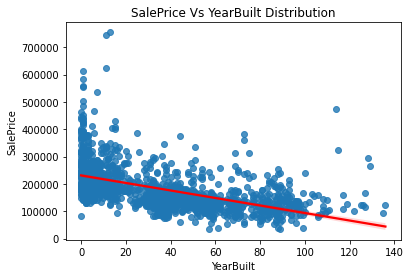

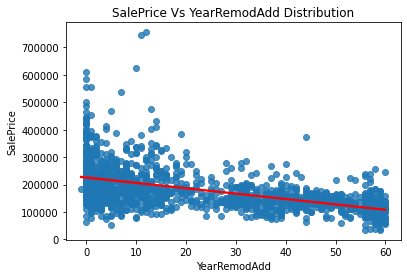

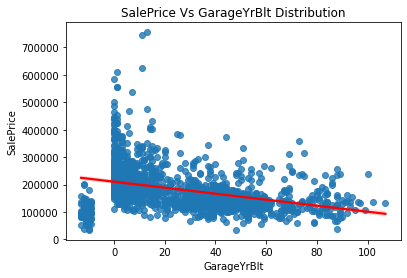

In [17]:
# Comparing the Age of the Building / Renovated Building / Garage with the Sold Price
'''There is some linear relationship'''

for clm in ['YearBuilt', 'YearRemodAdd', 'GarageYrBlt']:

    df[clm]=df['YrSold']-df[clm]
    sns.regplot(df[clm],df['SalePrice'],line_kws={"color": "red"})
    plt.xlabel(clm)
    plt.ylabel('SalePrice')
    plt.title(f'SalePrice Vs {clm} Distribution')
    plt.show()

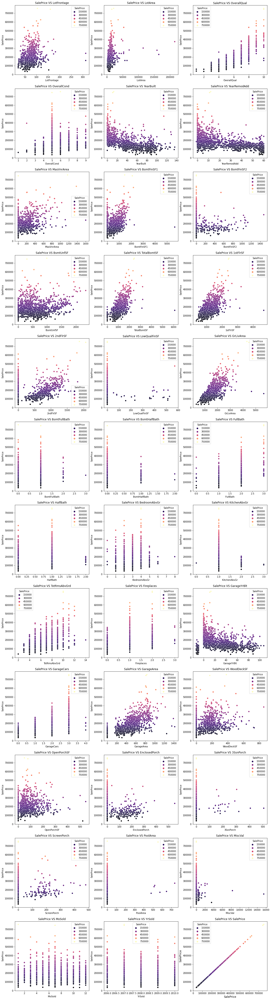

In [18]:
# Lets visualize numerical predictor variables with Target Variables

df_num = df.select_dtypes(include=['int64','float64'])
fig,axs= plt.subplots(12,3,figsize=(20,80))

for i,ax in zip(df_num.columns,axs.flatten()):
    sns.scatterplot(x=i, y='SalePrice', hue='SalePrice',data=df_num,ax=ax,palette='magma')
    plt.xlabel(i,fontsize=12)
    plt.ylabel('SalePrice',fontsize=12)
    ax.set_title('SalePrice'+' VS '+str(i))

***Observations from the above plot:***
- New properties are more expensive than older homes.
- GRLiving Area is directly related to the proce of the property.
- The entire basement size, which is proportionate to the total living area, is also proportional to the property price.
- The month sold has no influence on the pricing.

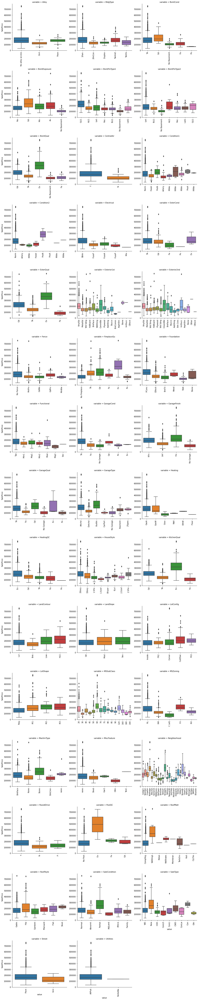

In [19]:
# Plotting Categorical Features with Sale Price
def facetgrid_boxplot(x, y, **kwargs):
    sns.boxplot(x=x, y=y)
    x=plt.xticks(rotation=90)
    
categorical = df.select_dtypes('object')
f = pd.melt(df, id_vars=['SalePrice'], value_vars=sorted(df[categorical.columns]))
g = sns.FacetGrid(f, col="variable", col_wrap=3, sharex=False, sharey=False, size=5)
g = g.map(facetgrid_boxplot, "value", "SalePrice")

***We have to deal with few outliers in the feature engineering section by capping them at a lower percentile.***

**The box plots above show that:**

- Paved alleys properties demand a higher price.
- Houses with decent to exceptional basement condition sell for more money than others.
- Houses with decent to excellent garages sell for more money.
- Houses with high-quality kitchens have a positive influence on pricing.

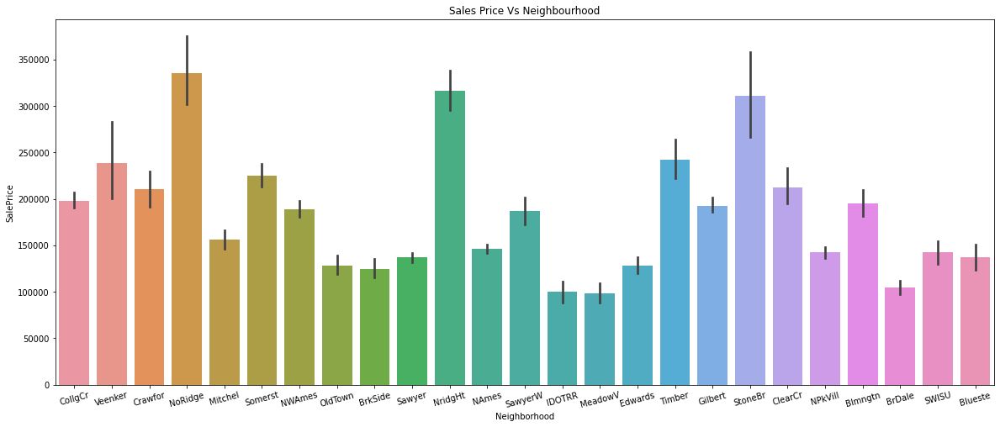

In [20]:
# Lets plot 'Sale Price' Vs 'Neighborhood'
'''We can see that some Neighbourhood types have higher sales price'''

plt.figure(figsize=(20, 8))
sns.barplot(x="Neighborhood", y="SalePrice", data= df)
plt.title("Sales Price Vs Neighbourhood")
plt.xticks(rotation=15);

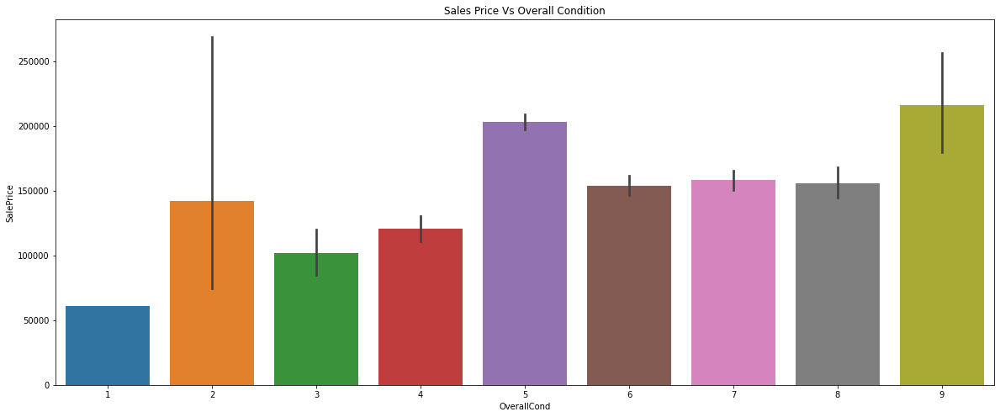

In [21]:
# Lets plot 'overall condition' Vs 'Saleprice'
'''There is incremental trend with Overall conditions wrt sales price'''

plt.figure(figsize=(20, 8))
sns.barplot(x="OverallCond", y="SalePrice", data= df)
plt.title("Sales Price Vs Overall Condition");

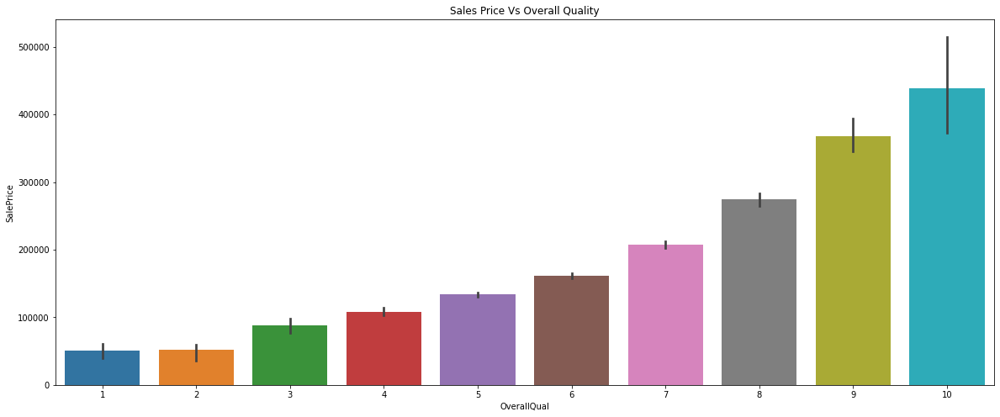

In [22]:
# Lets plot 'overall quality' Vs 'Saleprice'

plt.figure(figsize=(20, 8))
sns.barplot(x="OverallQual", y="SalePrice", data= df)
plt.title("Sales Price Vs Overall Quality");

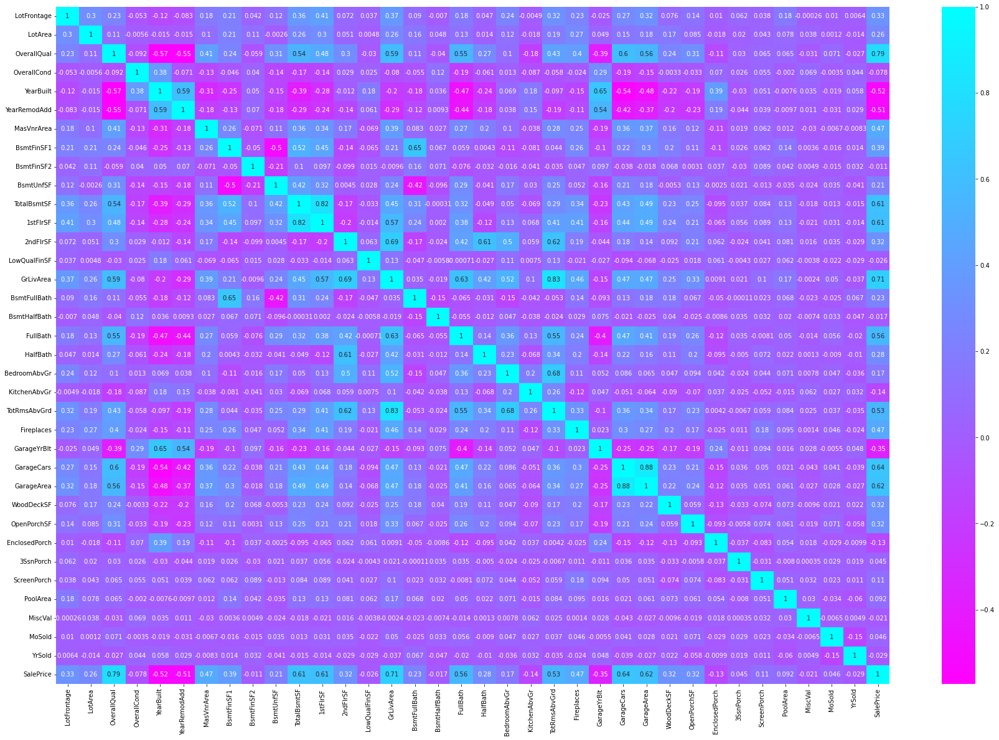

In [23]:
# plotting correlations on a heatmap

# figure size
plt.figure(figsize=(30,20))

# heatmap
sns.heatmap(df.corr(), cmap="cool_r", annot=True)
plt.show()

***Clearly there are some features are highly correlated with each other***

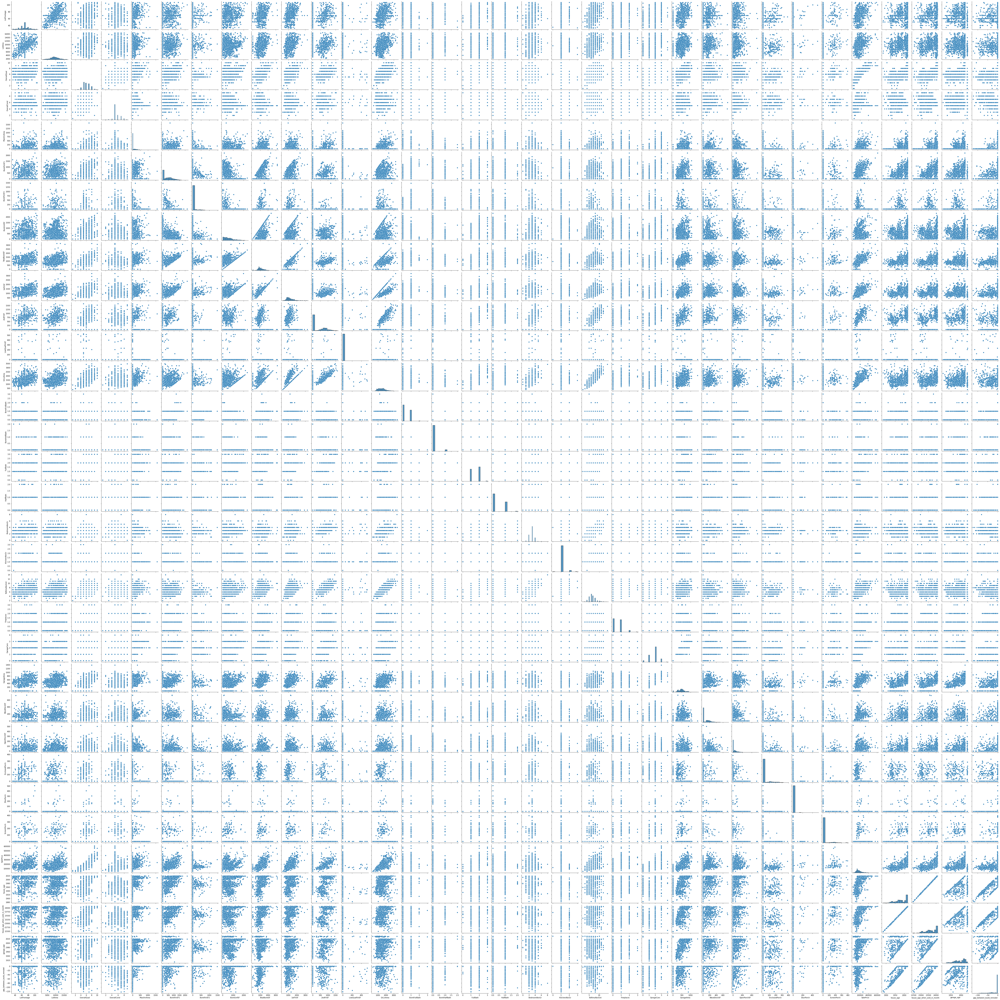

In [111]:
# paiwise scatter plot for all numeric columns
sns.pairplot(df.select_dtypes(include=['float64', 'int64']))
plt.show();

# Outliers Treatment

Outliers exist in data according to data distribution and box plot, however we can't treat outliers in all columns since we have a small data set, and outliers in certain columns make sense. As a result, we will only consider outliers in a few columns.

Below we have done outliers treatment for LotFrontage, LotArea, PoolArea, MiscVal

In [25]:
# outlier treatment for LotFrontage
Q1 = df.LotFrontage.quantile(0.25)
Q3 = df.LotFrontage.quantile(0.75)
IQR = Q3 - Q1
df = df[(df.LotFrontage >= Q1 - 1.5*IQR) & (df.LotFrontage <= Q3 + 1.5*IQR)]

# outlier treatment for LotArea
Q1 = df.LotArea.quantile(0.25)
Q3 = df.LotArea.quantile(0.75)
IQR = Q3 - Q1
df = df[(df.LotArea >= Q1 - 1.5*IQR) & (df.LotArea <= Q3 + 1.5*IQR)]

# outlier treatment for PoolArea
Q1 = df.PoolArea.quantile(0.25)
Q3 = df.PoolArea.quantile(0.75)
IQR = Q3 - Q1
df = df[(df.PoolArea >= Q1 - 1.5*IQR) & (df.PoolArea <= Q3 + 1.5*IQR)]

# outlier treatment for MiscVal
Q1 = df.MiscVal.quantile(0.25)
Q3 = df.MiscVal.quantile(0.75)
IQR = Q3 - Q1
df = df[(df.MiscVal >= Q1 - 1.5*IQR) & (df.MiscVal <= Q3 + 1.5*IQR)]

In [26]:
# Check number of row retained after outlier treatment
df.shape

(1238, 80)

***Some columns have above 99% same values, thus it does not play any part on predicting the target variable.***

In [27]:
# Trying to remove features has 99% + same values in column

def redundant_feature(df):
    redundant = []
    for i in df.columns:
        counts = df[i].value_counts()
        count_max = counts.iloc[0]
        if count_max / len(df) * 100 > 99:
            redundant.append(i)
    redundant = list(redundant)
    return redundant

In [28]:
redundant_features = redundant_feature(df)
redundant_features

['Street',
 'Utilities',
 'Condition2',
 'RoofMatl',
 'PoolArea',
 'PoolQC',
 'MiscFeature',
 'MiscVal']

In [29]:
# Dropping Columns

df.drop(redundant_features,axis=1,inplace=True)

In [30]:
# Check number of row and column

df.shape

(1238, 72)

# Derive Column

In [31]:
# derive house age = 2019 - year build
df["house_age"] = 2019 - df["YearBuilt"]

# derive house age when sold in month as we have month and year both for sold house
df["house_age_when_sold_in_month"] = (((df["YrSold"]-1) - df["YearBuilt"])*12) + df["MoSold"]

# derive garage age = 2019 - year build
df["garage_age"] = 2019 - df["GarageYrBlt"]

# derive gap b/w house build and remodel = YearRemodAdd - year build
df["gap_between_build_remodel"] = df["YearRemodAdd"] - df["YearBuilt"]

In [32]:
# Drop the unwanted column
df = df.drop(['GarageYrBlt','YearBuilt','YrSold','YearRemodAdd','MoSold'], axis=1)

In [33]:
df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Alley,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,Fence,SaleType,SaleCondition,SalePrice,house_age,house_age_when_sold_in_month,garage_age,gap_between_build_remodel
0,60,RL,65.0,8450,No alley access,Reg,Lvl,Inside,Gtl,CollgCr,Norm,1Fam,2Story,7,5,Gable,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,No Fireplace,Attchd,RFn,2,548,TA,TA,Y,0,61,0,0,0,No Fence,WD,Normal,208500,2014,24026,2014.0,0
1,20,RL,80.0,9600,No alley access,Reg,Lvl,FR2,Gtl,Veenker,Feedr,1Fam,1Story,6,8,Gable,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,RFn,2,460,TA,TA,Y,298,0,0,0,0,No Fence,WD,Normal,181500,1988,23705,1988.0,0
2,60,RL,68.0,11250,No alley access,IR1,Lvl,Inside,Gtl,CollgCr,Norm,1Fam,2Story,7,5,Gable,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,RFn,2,608,TA,TA,Y,0,42,0,0,0,No Fence,WD,Normal,223500,2012,24009,2012.0,-1
3,70,RL,60.0,9550,No alley access,IR1,Lvl,Corner,Gtl,Crawfor,Norm,1Fam,2Story,7,5,Gable,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,Unf,3,642,TA,TA,Y,0,35,272,0,0,No Fence,WD,Abnorml,140000,1928,22970,2011.0,-55
4,60,RL,84.0,14260,No alley access,IR1,Lvl,FR2,Gtl,NoRidge,Norm,1Fam,2Story,8,5,Gable,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,RFn,3,836,TA,TA,Y,192,84,0,0,0,No Fence,WD,Normal,250000,2011,24000,2011.0,0


# Preparing Data For Model Building

In [34]:
# Lets define X and y

X = df.drop(['SalePrice'], axis=1)
y = df['SalePrice']

In [35]:
df_numeric = X.select_dtypes(exclude=['object'])
df_numeric.head()

,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,house_age,house_age_when_sold_in_month,garage_age,gap_between_build_remodel
0,65.0,8450,7,5,196.0,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2,548,0,61,0,0,0,2014,24026,2014.0,0
1,80.0,9600,6,8,0.0,978,0,284,1262,1262,0,0,1262,0,1,2,0,3,1,6,1,2,460,298,0,0,0,0,1988,23705,1988.0,0
2,68.0,11250,7,5,162.0,486,0,434,920,920,866,0,1786,1,0,2,1,3,1,6,1,2,608,0,42,0,0,0,2012,24009,2012.0,-1
3,60.0,9550,7,5,0.0,216,0,540,756,961,756,0,1717,1,0,1,0,3,1,7,1,3,642,0,35,272,0,0,1928,22970,2011.0,-55
4,84.0,14260,8,5,350.0,655,0,490,1145,1145,1053,0,2198,1,0,2,1,4,1,9,1,3,836,192,84,0,0,0,2011,24000,2011.0,0


In [36]:
df_categorical = X.select_dtypes(include=['object'])
df_categorical.head()

,MSSubClass,MSZoning,Alley,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,BldgType,HouseStyle,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,Fence,SaleType,SaleCondition
0,60,RL,No alley access,Reg,Lvl,Inside,Gtl,CollgCr,Norm,1Fam,2Story,Gable,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,No Fireplace,Attchd,RFn,TA,TA,Y,No Fence,WD,Normal
1,20,RL,No alley access,Reg,Lvl,FR2,Gtl,Veenker,Feedr,1Fam,1Story,Gable,MetalSd,MetalSd,None,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,TA,Attchd,RFn,TA,TA,Y,No Fence,WD,Normal
2,60,RL,No alley access,IR1,Lvl,Inside,Gtl,CollgCr,Norm,1Fam,2Story,Gable,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,No Fence,WD,Normal
3,70,RL,No alley access,IR1,Lvl,Corner,Gtl,Crawfor,Norm,1Fam,2Story,Gable,Wd Sdng,Wd Shng,None,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Gd,Detchd,Unf,TA,TA,Y,No Fence,WD,Abnorml
4,60,RL,No alley access,IR1,Lvl,FR2,Gtl,NoRidge,Norm,1Fam,2Story,Gable,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,No Fence,WD,Normal


In [37]:
# Create dummuies

df_dummies = pd.get_dummies(df_categorical, drop_first=True)
df_dummies.head()

,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Alley_No alley access,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,MasVnrType_none,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_No Basement,BsmtQual_TA,BsmtCond_Gd,BsmtCond_No Basement,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtExposure_No Basement,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_No Basement,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_No Basement,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_No Fireplace,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_No Garage,GarageFinish_No Garage,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_Gd,GarageQual_No Garage,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_No Garage,GarageCond_Po,GarageCond_TA,PavedDrive_P,PavedDrive_Y,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_No Fence,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,1,0

In [38]:
# drop original categorical variables

X = X.drop(list(df_categorical.columns), axis=1)

In [39]:
# concat dummy variables with X

X = pd.concat([X, df_dummies], axis=1)

In [40]:
# Checking X data frame
X.head()

,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,house_age,house_age_when_sold_in_month,garage_age,gap_between_build_remodel,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Alley_No alley access,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,MasVnrType_none,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_No Basement,BsmtQual_TA,BsmtCond_Gd,BsmtCond_No Basement,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtExposure_No Basement,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_No Basement,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_No Basement,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_No Fireplace,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_No Garage,GarageFinish_No Garage,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_Gd,GarageQual_No Garage,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_No Garage,GarageCond_Po,GarageCond_TA,PavedDrive_P,PavedDrive_Y,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_No Fence,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,65.0,8450,7,5,196.0,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2,548,0,61,0,0,0,20

In [41]:
# Cheking shape of X dataframe
X.shape

(1238, 242)

In [42]:
X.head()

,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,house_age,house_age_when_sold_in_month,garage_age,gap_between_build_remodel,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Alley_No alley access,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,MasVnrType_none,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_No Basement,BsmtQual_TA,BsmtCond_Gd,BsmtCond_No Basement,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtExposure_No Basement,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_No Basement,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_No Basement,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_No Fireplace,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_No Garage,GarageFinish_No Garage,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_Gd,GarageQual_No Garage,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_No Garage,GarageCond_Po,GarageCond_TA,PavedDrive_P,PavedDrive_Y,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_No Fence,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,65.0,8450,7,5,196.0,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2,548,0,61,0,0,0,20

# Model Building

In [43]:
# split data into test and train

X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size = 0.2, 
                                                    random_state = 42)

In [44]:
# Lets apply Min Max Scaler
'''We can apply MinMax Scaler on Dummy varibles as well it will not do any chnages on them as max and min values 
are 0 and 1'''

scaler = MinMaxScaler()

X_train[df_numeric.columns] = scaler.fit_transform(X_train[df_numeric.columns])

X_test[df_numeric.columns] = scaler.transform(X_test[df_numeric.columns])

In [45]:
# Check data after scaling
X_train.describe()

,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,house_age,house_age_when_sold_in_month,garage_age,gap_between_build_remodel,MSSubClass_30,MSSubClass_40,MSSubClass_45,MSSubClass_50,MSSubClass_60,MSSubClass_70,MSSubClass_75,MSSubClass_80,MSSubClass_85,MSSubClass_90,MSSubClass_120,MSSubClass_160,MSSubClass_180,MSSubClass_190,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Alley_No alley access,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,MasVnrType_none,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_No Basement,BsmtQual_TA,BsmtCond_Gd,BsmtCond_No Basement,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtExposure_No Basement,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_No Basement,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_No Basement,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_No Fireplace,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_No Garage,GarageFinish_No Garage,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_Gd,GarageQual_No Garage,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_No Garage,GarageCond_Po,GarageCond_TA,PavedDrive_P,PavedDrive_Y,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_No Fence,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
count,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990

### Linear Regression

In [46]:
# let's build a Linear regression model first

# Instantiate
lm = LinearRegression()

# Fit a line
lm.fit(X_train, y_train)

LinearRegression()

In [47]:
# Print the coefficients and intercept

model_parameters = list(lm.coef_)
model_parameters.insert(0, lm.intercept_)
model_parameters = [round(x, 3) for x in model_parameters]
cols = X.columns
cols = cols.insert(0, "constant")
list(zip(cols, model_parameters))

[('constant', -25108.907),
 ('LotFrontage', 4628.232),
 ('LotArea', 29669.517),
 ('OverallQual', 50538.624),
 ('OverallCond', 40909.937),
 ('MasVnrArea', 6495.921),
 ('BsmtFinSF1', 1.599493787919834e+16),
 ('BsmtFinSF2', 1.0775383196490092e+16),
 ('BsmtUnfSF', 1.7076862379219732e+16),
 ('TotalBsmtSF', -2.34368239673012e+16),
 ('1stFlrSF', -4398605574960143.5),
 ('2ndFlrSF', -2448567236082893.0),
 ('LowQualFinSF', -802509932132690.8),
 ('GrLivArea', 4731464808319193.0),
 ('BsmtFullBath', 1777.961),
 ('BsmtHalfBath', 3748.401),
 ('FullBath', 22695.155),
 ('HalfBath', 10331.225),
 ('BedroomAbvGr', -25429.578),
 ('KitchenAbvGr', -31110.711),
 ('TotRmsAbvGrd', 13050.054),
 ('Fireplaces', 10067.884),
 ('GarageCars', 13909.823),
 ('GarageArea', 22617.81),
 ('WoodDeckSF', 13658.385),
 ('OpenPorchSF', 13017.569),
 ('EnclosedPorch', 10131.302),
 ('3SsnPorch', -56.188),
 ('ScreenPorch', 13974.191),
 ('house_age', 61070.497),
 ('house_age_when_sold_in_month', 13058.215),
 ('garage_age', -8185.442)

In [48]:
# Model Prediction and Differnt perfromance Maxtrix

y_pred_train = lm.predict(X_train)
y_pred_test = lm.predict(X_test)

metric = []
r2_train_lr = r2_score(y_train, y_pred_train)
metric.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
metric.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
metric.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
metric.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
metric.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
metric.append(mse_test_lr**0.5)

In [49]:
# Setiing float format in pandas
pd.set_option('display.float_format', lambda x: '%.4f' % x)

In [50]:
# Creating a table which contain all the metrics

lr_table = {'Metric': ['R2 Score (Train)','R2 Score (Test)','RSS (Train)','RSS (Test)',
                       'MSE (Train)','MSE (Test)'], 
        'Linear Regression': metric
        }

lr_metric = pd.DataFrame(lr_table ,columns = ['Metric', 'Linear Regression'] )

lr_metric

,Metric,Linear Regression
0,R2 Score (Train),0.9468
1,R2 Score (Test),-4136433517310576640.0000
2,RSS (Train),292696711993.5419
3,RSS (Test),4777381876316425004098514845696.0000
4,MSE (Train),17194.5702
5,MSE (Test),138793503443245.1406


***We can clearly see from above table that Linear Regression Model is overfited. Lets now apply Ridge and Lasso regression to reduce model complexity and overfiting***

### Ridge Regression

In [51]:
# Lets select best value of lambda for given dataset

params = {
    'alpha': [
        0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9,
        1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500,
        1000
    ]
}

ridge = Ridge()

# cross validation
folds = 5
model_cv = GridSearchCV(estimator=ridge,
                        param_grid=params,
                        scoring='neg_mean_absolute_error',
                        cv=folds,
                        return_train_score=True,
                        verbose=1)
model_cv.fit(X_train, y_train)

Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [52]:
# results data frame
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.0127,0.0018,0.0033,0.0012,0.0001,{'alpha': 0.0001},-16231.0426,-17306.0706,-15252.7321,-17406.9297,-17701.1172,-16779.5784,911.2792,24,-11034.5369,-11144.6022,-11631.0099,-11140.2996,-11100.6232,-11210.2144,214.0723
1,0.0125,0.0042,0.0034,0.0019,0.0010,{'alpha': 0.001},-16227.8957,-17300.6714,-15234.5087,-17394.6468,-17693.2994,-16770.2044,913.8805,23,-11034.8322,-11144.8129,-11632.4060,-11140.2784,-11101.6891,-11210.8037,214.4524
2,0.0103,0.0005,0.0040,0.0006,0.0100,{'alpha': 0.01},-16196.8729,-17253.6281,-15086.5393,-17279.7678,-17619.2405,-16687.2097,932.0099,22,-11037.6258,-11147.2351,-11645.1913,-11140.8759,-11111.9875,-11216.5831,217.8126
3,0.0148,0.0034,0.0012,0.0019,0.0500,{'alpha': 0.05},-16103.8802,-17111.7434,-14740.4062,-16912.2454,-17332.0661,-16440.0683,945.6884,20,-11049.6792,-11161.4659,-11686.1129,-11154.3556,-11148.9760,-11240.1179,226.7274
4,0.0104,0.0086,0.0063,0.0082,0.1000,{'alpha': 0.1},-16012.7281,-16951.5123,-14557.4770,-16631.0622,-17061.5692,-16242.8697,918.3300,19,-11067.8455,-11178.1764,-11724.6725,-11171.5111,-11185.6314,-11265.5674,233.5573


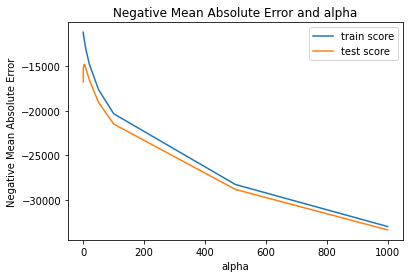

In [53]:
# plotting mean test and train scoes with alpha to tune hyper parameter
cv_results['param_alpha'] = cv_results['param_alpha'].astype('int32')

# plotting
plt.plot(cv_results['param_alpha'], cv_results['mean_train_score'])
plt.plot(cv_results['param_alpha'], cv_results['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('Negative Mean Absolute Error')
plt.title("Negative Mean Absolute Error and alpha")
plt.legend(['train score', 'test score'])
plt.show()

In [54]:
# Printing the best hyperparameter alpha
print(model_cv.best_params_)

{'alpha': 3.0}


In [55]:
# Let fit  Ridge model for best alpha and printing coefficients which have been penalised
alpha = model_cv.best_params_['alpha']
ridge = Ridge(alpha=alpha)

ridge.fit(X_train, y_train)

Ridge(alpha=3.0)

In [56]:
# Print the coefficients and intercept

model_parameters = list(ridge.coef_)
model_parameters.insert(0, ridge.intercept_)
model_parameters = [round(x, 3) for x in model_parameters]
cols = X.columns
cols = cols.insert(0, "constant")
list(zip(cols, model_parameters))

[('constant', 16572.19),
 ('LotFrontage', 8911.538),
 ('LotArea', 25210.728),
 ('OverallQual', 47798.963),
 ('OverallCond', 33133.997),
 ('MasVnrArea', 11689.186),
 ('BsmtFinSF1', 37317.52),
 ('BsmtFinSF2', 10771.73),
 ('BsmtUnfSF', 13860.676),
 ('TotalBsmtSF', 40519.901),
 ('1stFlrSF', 49466.702),
 ('2ndFlrSF', 29126.969),
 ('LowQualFinSF', -3440.736),
 ('GrLivArea', 60476.541),
 ('BsmtFullBath', 7317.545),
 ('BsmtHalfBath', -863.179),
 ('FullBath', 25361.905),
 ('HalfBath', 12533.723),
 ('BedroomAbvGr', -10153.45),
 ('KitchenAbvGr', -12700.246),
 ('TotRmsAbvGrd', 17440.806),
 ('Fireplaces', 10366.898),
 ('GarageCars', 16820.237),
 ('GarageArea', 21360.514),
 ('WoodDeckSF', 11586.752),
 ('OpenPorchSF', 13815.259),
 ('EnclosedPorch', 5261.316),
 ('3SsnPorch', 1450.274),
 ('ScreenPorch', 10314.429),
 ('house_age', 21566.256),
 ('house_age_when_sold_in_month', 21241.373),
 ('garage_age', -1682.86),
 ('gap_between_build_remodel', -11293.009),
 ('MSSubClass_30', -1934.87),
 ('MSSubClass_40

In [57]:
# Top main 20 columns

ridge_df = pd.DataFrame(X.columns, columns=['column'])
ridge_df['coefficients']=ridge.coef_
ridge_df['abs_coefficients']=abs(ridge.coef_)
ridge_df.sort_values(by=['abs_coefficients'], ascending=False,inplace=True)
ridge_df.head(20)

,column,coefficients,abs_coefficients
12,GrLivArea,60476.5414,60476.5414
9,1stFlrSF,49466.7020,49466.7020
2,OverallQual,47798.9631,47798.9631
8,TotalBsmtSF,40519.9013,40519.9013
83,Neighborhood_StoneBr,39333.8687,39333.8687
5,BsmtFinSF1,37317.5204,37317.5204
3,OverallCond,33133.9970,33133.9970
10,2ndFlrSF,29126.9687,29126.9687
15,FullBath,25361.9053,25361.9053
1,LotArea,25210.7276,25210.7276


In [58]:
# Model Prediction and Differnt perfromance Maxtrix

y_pred_train = ridge.predict(X_train)
y_pred_test = ridge.predict(X_test)

metric2 = []
r2_train_lr = r2_score(y_train, y_pred_train)
metric2.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
metric2.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
metric2.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
metric2.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
metric2.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
metric2.append(mse_test_lr**0.5)

In [59]:
# Creating a table which contain all the metrics

rideg_table = {'Metric': ['R2 Score (Train)','R2 Score (Test)','RSS (Train)','RSS (Test)',
                       'MSE (Train)','MSE (Test)'], 
        'Ridge Regression': metric2
        }

rideg_table = pd.DataFrame(rideg_table ,columns = ['Metric', 'Ridge Regression'] )

rideg_table

,Metric,Ridge Regression
0,R2 Score (Train),0.9405
1,R2 Score (Test),0.9130
2,RSS (Train),327534556575.3362
3,RSS (Test),100486421659.6973
4,MSE (Train),18189.0898
5,MSE (Test),20129.2619


***We can clearly see that R2 score for Train and Test data is very close compare to Linear regression model. Using Ridge Regression model we handel overfitting of the model. We can clear see that many coefficient are push toward zero by Ridge regressor***

### Lasso Regression

In [60]:
# Lets select best value of lambda for given dataset

params = {
    'alpha': [
        0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9,
        1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500,
        1000
    ]
}

lasso = Lasso()

# cross validation
folds = 5
model_cv = GridSearchCV(estimator=lasso,
                        param_grid=params,
                        scoring='neg_mean_absolute_error',
                        cv=folds,
                        return_train_score=True,
                        verbose=1)
model_cv.fit(X_train, y_train)

Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [61]:
# results data frame
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.1066,0.0117,0.0028,0.0008,0.0001,{'alpha': 0.0001},-16152.8907,-17257.3605,-15205.5869,-17477.5503,-17699.6544,-16758.6086,941.2724,26,-11033.5668,-11143.8077,-11627.5643,-11139.6158,-11099.0857,-11208.7280,213.1280
1,0.1128,0.0181,0.0018,0.0015,0.0010,{'alpha': 0.001},-16152.1539,-17258.0073,-15205.7002,-17470.1301,-17699.4202,-16757.0824,940.2222,25,-11033.5654,-11143.8036,-11627.5634,-11139.6095,-11099.0931,-11208.7270,213.1278
2,0.1152,0.0192,0.0018,0.0015,0.0100,{'alpha': 0.01},-16144.9348,-17263.3428,-15206.7171,-17432.5512,-17697.0424,-16748.9177,935.3188,24,-11033.6763,-11143.8502,-11627.7041,-11139.6425,-11099.3293,-11208.8405,213.1357
3,0.1044,0.0143,0.0062,0.0054,0.0500,{'alpha': 0.05},-16124.2992,-17263.2230,-15199.8501,-17419.2568,-17686.2555,-16738.5769,936.1293,23,-11034.2536,-11144.1817,-11629.0034,-11139.9369,-11100.6585,-11209.6068,213.3759
4,0.1051,0.0120,0.0027,0.0004,0.1000,{'alpha': 0.1},-16124.7027,-17245.4122,-15185.4124,-17401.2859,-17673.1391,-16725.9904,933.5782,22,-11035.0133,-11144.9612,-11630.5739,-11140.2513,-11102.5175,-11210.6634,213.6109


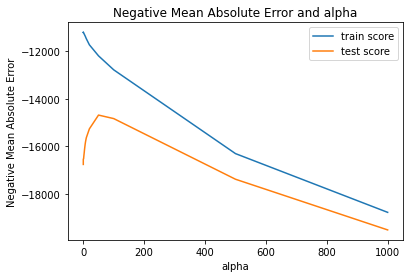

In [62]:
# plotting mean test and train scoes with alpha to tune hyper parameter
cv_results['param_alpha'] = cv_results['param_alpha'].astype('int32')

# plotting
plt.plot(cv_results['param_alpha'], cv_results['mean_train_score'])
plt.plot(cv_results['param_alpha'], cv_results['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('Negative Mean Absolute Error')
plt.title("Negative Mean Absolute Error and alpha")
plt.legend(['train score', 'test score'])
plt.show()

In [63]:
# Printing the best hyperparameter alpha
print(model_cv.best_params_)

{'alpha': 50}


In [64]:
# Let fit  Ridge model for best alpha and printing coefficients which have been penalised
alpha = model_cv.best_params_['alpha']
lasso = Lasso(alpha=alpha)

lasso.fit(X_train, y_train)

Lasso(alpha=50)

In [65]:
# Print the coefficients and intercept

model_parameters = list(lasso.coef_)
model_parameters.insert(0, lasso.intercept_)
model_parameters = [round(x, 3) for x in model_parameters]
cols = X.columns
cols = cols.insert(0, "constant")
list(zip(cols, model_parameters))

[('constant', -6140.667),
 ('LotFrontage', 6217.128),
 ('LotArea', 23584.3),
 ('OverallQual', 59809.715),
 ('OverallCond', 43188.719),
 ('MasVnrArea', 3899.79),
 ('BsmtFinSF1', 29227.93),
 ('BsmtFinSF2', 3069.45),
 ('BsmtUnfSF', -0.0),
 ('TotalBsmtSF', 65149.452),
 ('1stFlrSF', 0.0),
 ('2ndFlrSF', 0.0),
 ('LowQualFinSF', -3921.903),
 ('GrLivArea', 156058.442),
 ('BsmtFullBath', 5489.051),
 ('BsmtHalfBath', -0.0),
 ('FullBath', 16207.125),
 ('HalfBath', 7199.469),
 ('BedroomAbvGr', -12851.142),
 ('KitchenAbvGr', -17889.974),
 ('TotRmsAbvGrd', 0.0),
 ('Fireplaces', 2046.338),
 ('GarageCars', 17454.407),
 ('GarageArea', 14494.247),
 ('WoodDeckSF', 9034.229),
 ('OpenPorchSF', 9181.386),
 ('EnclosedPorch', 1211.762),
 ('3SsnPorch', 0.0),
 ('ScreenPorch', 9711.954),
 ('house_age', 35974.574),
 ('house_age_when_sold_in_month', 19914.871),
 ('garage_age', 0.0),
 ('gap_between_build_remodel', -9871.58),
 ('MSSubClass_30', 0.0),
 ('MSSubClass_40', 0.0),
 ('MSSubClass_45', 1403.559),
 ('MSSubClas

In [66]:
# Top main 20 columns

lasso_df = pd.DataFrame(X.columns, columns=['column'])
lasso_df['coefficients']=lasso.coef_
lasso_df['abs_coefficients']=abs(lasso.coef_)
lasso_df.sort_values(by=['abs_coefficients'], ascending=False,inplace=True)
lasso_df.head(20)

,column,coefficients,abs_coefficients
12,GrLivArea,156058.4419,156058.4419
8,TotalBsmtSF,65149.4521,65149.4521
2,OverallQual,59809.7145,59809.7145
83,Neighborhood_StoneBr,45252.6830,45252.6830
3,OverallCond,43188.7187,43188.7187
28,house_age,35974.5739,35974.5739
5,BsmtFinSF1,29227.9300,29227.9300
76,Neighborhood_NoRidge,27393.5775,27393.5775
67,Neighborhood_Crawfor,23706.9633,23706.9633
1,LotArea,23584.3002,23584.3002


In [67]:
# Model Prediction and Differnt perfromance Maxtrix

y_pred_train = lasso.predict(X_train)
y_pred_test = lasso.predict(X_test)

metric3 = []
r2_train_lr = r2_score(y_train, y_pred_train)
metric3.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
metric3.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
metric3.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
metric3.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
metric3.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
metric3.append(mse_test_lr**0.5)

In [68]:
# Creating a table which contain all the metrics

lasso_table = {'Metric': ['R2 Score (Train)','R2 Score (Test)','RSS (Train)','RSS (Test)',
                       'MSE (Train)','MSE (Test)'], 
        'Lasso Regression': metric3
        }

lasso_table = pd.DataFrame(lasso_table ,columns = ['Metric', 'Lasso Regression'] )

lasso_table

,Metric,Lasso Regression
0,R2 Score (Train),0.9387
1,R2 Score (Test),0.9148
2,RSS (Train),337015206088.8757
3,RSS (Test),98363349075.4278
4,MSE (Train),18450.4580
5,MSE (Test),19915.4816


### Ridge Regression after variable shrinkage done by Lasso

In [69]:
X_new = X[[name[0] for name in list(zip(cols, model_parameters)) if name[1]!=0 and name[0]!='constant']]

In [70]:
# split data into test and train

X_train_new, X_test_new, y_train_new, y_test_new = train_test_split(X_new, y, 
                                                    test_size = 0.2, 
                                                    random_state = 42)

In [71]:
# Lets apply Min Max Scaler
'''We can apply MinMax Scaler on Dummy varibles as well it will not do any chnages on them as max and min values 
are 0 and 1'''

scaler = MinMaxScaler()

X_train_new[X_train_new.columns] = scaler.fit_transform(X_train_new[X_train_new.columns])

X_test_new[X_train_new.columns] = scaler.transform(X_test_new[X_train_new.columns])

In [72]:
# Lets select best value of lambda for given dataset

params = {
    'alpha': [
        0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9,
        1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500,
        1000
    ]
}

ridge2 = Ridge()

# cross validation
folds = 5
model_cv = GridSearchCV(estimator=ridge2,
                        param_grid=params,
                        scoring='neg_mean_absolute_error',
                        cv=folds,
                        return_train_score=True,
                        verbose=1)
model_cv.fit(X_train_new, y_train_new)

Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [73]:
# results data frame
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.0056,0.0030,0.0030,0.0015,0.0001,{'alpha': 0.0001},-14781.4645,-15230.6529,-13095.8716,-14824.7194,-16099.7436,-14806.4904,977.7109,18,-11887.0762,-11822.0023,-12450.9745,-12012.1281,-12127.9898,-12060.0342,221.9554
1,0.0062,0.0039,0.0031,0.0030,0.0010,{'alpha': 0.001},-14780.6570,-15228.7426,-13093.9524,-14823.3208,-16095.5316,-14804.4409,977.1018,17,-11886.7888,-11821.7176,-12450.4728,-12011.9381,-12127.3656,-12059.6566,221.8545
2,0.0060,0.0030,0.0033,0.0021,0.0100,{'alpha': 0.01},-14773.0342,-15212.8310,-13077.2088,-14811.0261,-16061.8785,-14787.1957,972.7081,16,-11884.0700,-11820.5921,-12446.1419,-12010.7561,-12123.1515,-12056.9423,220.7892
3,0.0061,0.0057,0.0012,0.0012,0.0500,{'alpha': 0.05},-14743.1195,-15167.9783,-13016.6028,-14770.6526,-15981.4725,-14735.9651,969.0599,14,-11873.9798,-11820.4540,-12433.9276,-12010.0690,-12114.6252,-12050.6111,217.6437
4,0.0036,0.0026,0.0027,0.0020,0.1000,{'alpha': 0.1},-14708.7326,-15128.0703,-12956.6148,-14732.2741,-15921.0058,-14689.3395,970.9831,13,-11865.1385,-11822.2870,-12425.1356,-12010.9850,-12110.3971,-12046.7886,215.3472


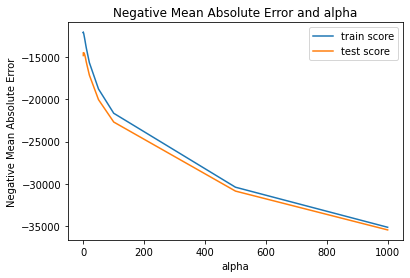

In [74]:
# plotting mean test and train scoes with alpha to tune hyper parameter
cv_results['param_alpha'] = cv_results['param_alpha'].astype('int32')

# plotting
plt.plot(cv_results['param_alpha'], cv_results['mean_train_score'])
plt.plot(cv_results['param_alpha'], cv_results['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('Negative Mean Absolute Error')
plt.title("Negative Mean Absolute Error and alpha")
plt.legend(['train score', 'test score'])
plt.show()

In [75]:
# Printing the best hyperparameter alpha
print(model_cv.best_params_)

{'alpha': 1.0}


In [76]:
# Let fit  Ridge model for best alpha and printing coefficients which have been penalised
alpha = model_cv.best_params_['alpha']
ridge2 = Ridge(alpha=alpha)

ridge2.fit(X_train_new, y_train_new)

Ridge()

In [77]:
len(cols)

243

In [78]:
# Print the coefficients and intercept

model_parameters = list(ridge2.coef_)
model_parameters.insert(0, ridge2.intercept_)
model_parameters = [round(x, 3) for x in model_parameters]
cols = X_new.columns
cols = cols.insert(0, "constant")
list(zip(cols, model_parameters))

[('constant', 2587.889),
 ('LotFrontage', 8106.286),
 ('LotArea', 26253.994),
 ('OverallQual', 52675.71),
 ('OverallCond', 39757.035),
 ('MasVnrArea', 9935.119),
 ('BsmtFinSF1', 31212.769),
 ('BsmtFinSF2', 12147.176),
 ('TotalBsmtSF', 63952.408),
 ('LowQualFinSF', -8774.785),
 ('GrLivArea', 129676.738),
 ('BsmtFullBath', 5520.2),
 ('FullBath', 27545.638),
 ('HalfBath', 12392.688),
 ('BedroomAbvGr', -8136.835),
 ('KitchenAbvGr', -14613.059),
 ('Fireplaces', 5406.393),
 ('GarageCars', 18485.875),
 ('GarageArea', 19364.814),
 ('WoodDeckSF', 11783.079),
 ('OpenPorchSF', 13086.849),
 ('EnclosedPorch', 5079.909),
 ('ScreenPorch', 12386.729),
 ('house_age', 29878.82),
 ('house_age_when_sold_in_month', 28664.406),
 ('gap_between_build_remodel', -15516.049),
 ('MSSubClass_45', 5030.995),
 ('MSSubClass_50', 3305.025),
 ('MSSubClass_60', 3217.353),
 ('MSSubClass_80', -2743.675),
 ('MSSubClass_90', -10010.13),
 ('MSSubClass_120', -1593.059),
 ('MSSubClass_190', -5523.249),
 ('MSZoning_FV', 11568.1

In [79]:
# Top main 20 columns

ridge2_df = pd.DataFrame(X_new.columns, columns=['column'])
ridge2_df['coefficients']=ridge2.coef_
ridge2_df['abs_coefficients']=abs(ridge2.coef_)
ridge2_df.sort_values(by=['abs_coefficients'], ascending=False,inplace=True)
ridge2_df.head(20)

,column,coefficients,abs_coefficients
9,GrLivArea,129676.7381,129676.7381
7,TotalBsmtSF,63952.4079,63952.4079
2,OverallQual,52675.7099,52675.7099
55,Neighborhood_StoneBr,45246.9835,45246.9835
3,OverallCond,39757.0354,39757.0354
127,SaleType_CWD,38809.3562,38809.3562
5,BsmtFinSF1,31212.7686,31212.7686
22,house_age,29878.8198,29878.8198
23,house_age_when_sold_in_month,28664.4064,28664.4064
11,FullBath,27545.6378,27545.6378


In [80]:
# Model Prediction and Differnt perfromance Maxtrix

y_pred_train = ridge2.predict(X_train_new)
y_pred_test = ridge2.predict(X_test_new)

metric4 = []
r2_train_lr = r2_score(y_train_new, y_pred_train)
metric4.append(r2_train_lr)

r2_test_lr = r2_score(y_test_new, y_pred_test)
metric4.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train_new - y_pred_train))
metric4.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test_new - y_pred_test))
metric4.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train_new, y_pred_train)
metric4.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test_new, y_pred_test)
metric4.append(mse_test_lr**0.5)


In [81]:
# Creating a table which contain all the metrics

rideg_table2 = {'Metric': ['R2 Score (Train)','R2 Score (Test)','RSS (Train)','RSS (Test)',
                       'MSE (Train)','MSE (Test)'], 
        'Ridge Regression after Feature Selction': metric4
        }

rideg_table2 = pd.DataFrame(rideg_table2 ,columns = ['Metric', 'Ridge Regression after Feature Selction'] )

rideg_table2

,Metric,Ridge Regression after Feature Selction
0,R2 Score (Train),0.9406
1,R2 Score (Test),0.9096
2,RSS (Train),326746698284.1797
3,RSS (Test),104449473337.3044
4,MSE (Train),18167.2004
5,MSE (Test),20522.3593


***Clearly we can see improvement in MSE value of the model***

# Consolidate Results from all Models

In [82]:
# Creating a table which contain all the metrics

final_metric = pd.concat([lr_metric, rideg_table['Ridge Regression'], 
                          lasso_table['Lasso Regression'], rideg_table2['Ridge Regression after Feature Selction']], 
                         axis = 1)

final_metric

,Metric,Linear Regression,Ridge Regression,Lasso Regression,Ridge Regression after Feature Selction
0,R2 Score (Train),0.9468,0.9405,0.9387,0.9406
1,R2 Score (Test),-4136433517310576640.0000,0.9130,0.9148,0.9096
2,RSS (Train),292696711993.5419,327534556575.3362,337015206088.8757,326746698284.1797
3,RSS (Test),4777381876316425004098514845696.0000,100486421659.6973,98363349075.4278,104449473337.3044
4,MSE (Train),17194.5702,18189.0898,18450.4580,18167.2004
5,MSE (Test),138793503443245.1406,20129.2619,19915.4816,20522.3593


***Out of all model `Lasso Regression` is outperform with 92% R2 score and 19915 MSE score***

# Lets observe the changes in the coefficients

In [83]:
betas = pd.DataFrame(index=X.columns)
betas.rows = X.columns

betas['Linear'] = lm.coef_
betas['Ridge'] = ridge.coef_
betas['Lasso'] = lasso.coef_

pd.set_option('display.max_rows', None)
betas.head(100)

,Linear,Ridge,Lasso
LotFrontage,4628.2324,8911.5384,6217.1279
LotArea,29669.5175,25210.7276,23584.3002
OverallQual,50538.6240,47798.9631,59809.7145
OverallCond,40909.9374,33133.9970,43188.7187
MasVnrArea,6495.9210,11689.1859,3899.7904
BsmtFinSF1,15994937879198340.0000,37317.5204,29227.9300
BsmtFinSF2,10775383196490092.0000,10771.7300,3069.4496
BsmtUnfSF,17076862379219732.0000,13860.6759,-0.0000
TotalBsmtSF,-23436823967301200.0000,40519.9013,65149.4521
1stFlrSF,-4398605574960143.5000,49466.7020,0.0000


# Top 10 Best Performing Feature according to Lasso Regression are:

### Lasso Regression performing best on given data with Test R2 Score of 92%

 |  Feature  |  Description  |
 |  ---  |  ---  |
 |  GrLivArea  |  Above grade (ground) living area square feet  |
 |  TotalBsmtSF  |  Total square feet of basement area 
 |  OverallQual  |  Rates the overall material and finish of the house  |
 |  Neighborhood |  Physical locations within Ames city limits|
 |  OverallCond  |  Rates the overall condition of the house  |
 |  house_age    |  Rates the overall condition of the house|
 |  BsmtFinSF1   |  Type 1 finished square feet|
 |  LotArea      |  Lot size in square feet|
 |  ExterQual    |  Evaluates the quality of the material on the exterior |
 |  SaleType     |  Type of sale|

# Assignment Questions

***Question 1***

What is the optimal value of alpha for ridge and lasso regression? What will be the changes in the model if you choose double the value of alpha for both ridge and lasso? What will be the most important predictor variables after the change is implemented?

### Ridge Regression

In [84]:
# Let fit  Ridge model for best alpha and printing coefficients which have been penalised
ridge3 = Ridge(alpha=6)

ridge3.fit(X_train, y_train)

Ridge(alpha=6)

In [85]:
# Top main 20 columns

ridge3_df = pd.DataFrame(X.columns, columns=['column'])
ridge3_df['coefficients']=ridge3.coef_
ridge3_df['abs_coefficients']=abs(ridge3.coef_)
ridge3_df.sort_values(by=['abs_coefficients'], ascending=False,inplace=True)
ridge3_df.head(20)

,column,coefficients,abs_coefficients
12,GrLivArea,52032.6102,52032.6102
2,OverallQual,43526.2484,43526.2484
9,1stFlrSF,42940.6732,42940.6732
8,TotalBsmtSF,36182.6575,36182.6575
83,Neighborhood_StoneBr,34339.4260,34339.4260
5,BsmtFinSF1,33187.3370,33187.3370
3,OverallCond,27783.5046,27783.5046
15,FullBath,24811.1197,24811.1197
10,2ndFlrSF,24505.6597,24505.6597
1,LotArea,24084.6165,24084.6165


In [86]:
# Model Prediction and Differnt perfromance Maxtrix

y_pred_train = ridge.predict(X_train)
y_pred_test = ridge.predict(X_test)

metric5 = []
r2_train_lr = r2_score(y_train, y_pred_train)
metric5.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
metric5.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
metric5.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
metric5.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
metric5.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
metric5.append(mse_test_lr**0.5)

In [94]:
# Creating a table which contain all the metrics

rideg_table3 = {'Metric': ['R2 Score (Train)','R2 Score (Test)','RSS (Train)','RSS (Test)',
                       'MSE (Train)','MSE (Test)'], 
        'Ridge Regression Double Alpha': metric5
        }

rideg_table3 = pd.DataFrame(rideg_table3 ,columns = ['Metric', 'Ridge Regression Double Alpha'] )

rideg_table3

,Metric,Ridge Regression Double Aplha
0,R2 Score (Train),0.9405
1,R2 Score (Test),0.9130
2,RSS (Train),327534556575.3362
3,RSS (Test),100486421659.6973
4,MSE (Train),18189.0898
5,MSE (Test),20129.2619


### Lasso Regression

In [88]:
# Let fit  Ridge model for best alpha and printing coefficients which have been penalised
lasso3 = Lasso(alpha=100)

lasso3.fit(X_train, y_train)

Lasso(alpha=100)

In [89]:
# Top main 20 columns

lasso3_df = pd.DataFrame(X.columns, columns=['column'])
lasso3_df['coefficients']=lasso3.coef_
lasso3_df['abs_coefficients']=abs(lasso3.coef_)
lasso3_df.sort_values(by=['abs_coefficients'], ascending=False,inplace=True)
lasso3_df.head(20)

,column,coefficients,abs_coefficients
12,GrLivArea,147738.4018,147738.4018
2,OverallQual,68788.7013,68788.7013
8,TotalBsmtSF,67688.6504,67688.6504
3,OverallCond,42529.7686,42529.7686
83,Neighborhood_StoneBr,42002.1811,42002.1811
5,BsmtFinSF1,29134.7110,29134.7110
76,Neighborhood_NoRidge,26346.9461,26346.9461
29,house_age_when_sold_in_month,25013.2238,25013.2238
67,Neighborhood_Crawfor,22645.6141,22645.6141
1,LotArea,22450.9708,22450.9708


In [90]:
# Model Prediction and Differnt perfromance Maxtrix

y_pred_train = ridge.predict(X_train)
y_pred_test = ridge.predict(X_test)

metric6 = []
r2_train_lr = r2_score(y_train, y_pred_train)
metric6.append(r2_train_lr)

r2_test_lr = r2_score(y_test, y_pred_test)
metric6.append(r2_test_lr)

rss1_lr = np.sum(np.square(y_train - y_pred_train))
metric6.append(rss1_lr)

rss2_lr = np.sum(np.square(y_test - y_pred_test))
metric6.append(rss2_lr)

mse_train_lr = mean_squared_error(y_train, y_pred_train)
metric6.append(mse_train_lr**0.5)

mse_test_lr = mean_squared_error(y_test, y_pred_test)
metric6.append(mse_test_lr**0.5)

In [95]:
# Creating a table which contain all the metrics

lasso_table3 = {'Metric': ['R2 Score (Train)','R2 Score (Test)','RSS (Train)','RSS (Test)',
                       'MSE (Train)','MSE (Test)'], 
        'Lasso Regression Double Alpha': metric6
        }

lasso_table3 = pd.DataFrame(lasso_table3 ,columns = ['Metric', 'Lasso Regression Double Alpha'] )

lasso_table3

,Metric,Lasso Regression Double Aplha
0,R2 Score (Train),0.9405
1,R2 Score (Test),0.9130
2,RSS (Train),327534556575.3362
3,RSS (Test),100486421659.6973
4,MSE (Train),18189.0898
5,MSE (Test),20129.2619


### Comparing Results of Before and After changing Alpha

In [96]:
# Creating a table which contain all the metrics

final_metric = pd.concat([rideg_table,lasso_table['Lasso Regression'],
                          rideg_table3['Ridge Regression Double Alpha'],lasso_table3['Lasso Regression Double Alpha']], 
                         axis = 1)

final_metric

,Metric,Ridge Regression,Lasso Regression,Ridge Regression Double Aplha,Lasso Regression Double Aplha
0,R2 Score (Train),0.9405,0.9387,0.9405,0.9405
1,R2 Score (Test),0.9130,0.9148,0.9130,0.9130
2,RSS (Train),327534556575.3362,337015206088.8757,327534556575.3362,327534556575.3362
3,RSS (Test),100486421659.6973,98363349075.4278,100486421659.6973,100486421659.6973
4,MSE (Train),18189.0898,18450.4580,18189.0898,18189.0898
5,MSE (Test),20129.2619,19915.4816,20129.2619,20129.2619


***Since the alpha value was quite small, doubling it does not do any significant change in both the models and the R2 and MSE remains almost the same. The most important predictor position gets change little bit as shown below***

In [112]:
top_feature = pd.DataFrame()
top_feature['Ridge']=list(ridge_df['column'])
top_feature['Lasso']=list(lasso_df['column'])
top_feature['Rideg Double Alpha']=list(ridge3_df['column'])
top_feature['Lasso Double Alpha']=list(lasso3_df['column'])
top_feature.head(20)

,Ridge,Lasso,Rideg Double Alpha,Lasso Double Alpha
0,GrLivArea,GrLivArea,GrLivArea,GrLivArea
1,1stFlrSF,TotalBsmtSF,OverallQual,OverallQual
2,OverallQual,OverallQual,1stFlrSF,TotalBsmtSF
3,TotalBsmtSF,Neighborhood_StoneBr,TotalBsmtSF,OverallCond
4,Neighborhood_StoneBr,OverallCond,Neighborhood_StoneBr,Neighborhood_StoneBr
5,BsmtFinSF1,house_age,BsmtFinSF1,BsmtFinSF1
6,OverallCond,BsmtFinSF1,OverallCond,Neighborhood_NoRidge
7,2ndFlrSF,Neighborhood_NoRidge,FullBath,house_age_when_sold_in_month
8,FullBath,Neighborhood_Crawfor,2ndFlrSF,Neighborhood_Crawfor
9,LotArea,LotArea,LotArea,LotArea


### Question 3

After building the model, you realised that the five most important predictor variables in the lasso model are not available in the incoming data. You will now have to create another model excluding the five most important predictor variables. Which are the five most important predictor variables now?

In [105]:
X_train_lasso = X_train.drop(['GrLivArea','TotalBsmtSF','OverallQual','Neighborhood_StoneBr','OverallCond'],axis=1)
X_test_lasso = X_test.drop(['GrLivArea','TotalBsmtSF','OverallQual','Neighborhood_StoneBr','OverallCond'],axis=1)

In [107]:
# Let fit  Ridge model for best alpha and printing coefficients which have been penalised
lasso4 = Lasso(alpha=50)

lasso4.fit(X_train_lasso, y_train)

Lasso(alpha=50)

In [108]:
# Top main 20 columns

lasso4_df = pd.DataFrame(X_train_lasso.columns, columns=['column'])
lasso4_df['coefficients']=lasso4.coef_
lasso4_df['abs_coefficients']=abs(lasso4.coef_)
lasso4_df.sort_values(by=['abs_coefficients'], ascending=False,inplace=True)
lasso4_df.head(20)

,column,coefficients,abs_coefficients
6,1stFlrSF,167875.3833,167875.3833
7,2ndFlrSF,86420.6753,86420.6753
3,BsmtFinSF1,68512.7722,68512.7722
25,house_age_when_sold_in_month,51504.7119,51504.7119
5,BsmtUnfSF,37874.3725,37874.3725
224,SaleType_CWD,33689.6050,33689.6050
14,KitchenAbvGr,-29789.7021,29789.7021
139,ExterQual_TA,-29473.7935,29473.7935
4,BsmtFinSF2,26700.8718,26700.8718
137,ExterQual_Fa,-25818.6783,25818.6783


In [110]:
top_feature_lasso = pd.DataFrame()
top_feature_lasso['Lasso']=list(lasso_df['column'])[:20]
top_feature_lasso['Lasso After Removal Top 5 feature']=list(lasso4_df['column'])[:20]
top_feature_lasso

,Lasso,Lasso After Removal Top 5 feature
0,GrLivArea,1stFlrSF
1,TotalBsmtSF,2ndFlrSF
2,OverallQual,BsmtFinSF1
3,Neighborhood_StoneBr,house_age_when_sold_in_month
4,OverallCond,BsmtUnfSF
5,house_age,SaleType_CWD
6,BsmtFinSF1,KitchenAbvGr
7,Neighborhood_NoRidge,ExterQual_TA
8,Neighborhood_Crawfor,BsmtFinSF2
9,LotArea,ExterQual_Fa


### After removing top 5 features from Lasso and retrain model the new five top features are: 

 |  Feature  |  Description  |
 |  ---  |  ---  |
 | 1stFlrSF | First Floor square feet |
 | 2ndFlrSF | Second floor square feet |
 | BsmtFinSF1 | Type 1 finished square feet |
 | house_age_when_sold_in_month | House Age |
 | BsmtUnfSF | Unfinished square feet of basement area |